# Remote Sensing Image Captioning Using CNN–Transformer (RSICD)

Durgesh  
Indian Institute of Technology Bombay  
Department of Environmental Science and Engineering


In [ ]:
import pandas as pd
import numpy as np
import spacy
import torch
import torch.nn as nn
from PIL import Image
import re
import io
import os
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision
from collections import Counter
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torchvision.transforms as T
import math, time, ast, random
from nltk.translate.bleu_score import corpus_bleu

## Dataset Loading

This section downloads the RSICD dataset and loads the training, validation, and test splits.

In [ ]:
!wget --no-check-certificate \
    "http://nlp.stanford.edu/data/glove.6B.zip" \
    -O "/content/glove.6B.zip"

--2025-12-10 11:42:08--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2025-12-10 11:42:08--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2025-12-10 11:42:09--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘/content/glove.6B.z

In [ ]:
!unzip -q "/content/glove.6B.zip" -d "/content/glove"

In [ ]:
!unzip "/content/archive.zip" -d "/content/data"

Archive:  /content/archive.zip
  inflating: /content/data/test.csv  
  inflating: /content/data/train.csv  
  inflating: /content/data/valid.csv  


In [ ]:
df_train = pd.read_csv("/content/data/train.csv")
df_valid = pd.read_csv("/content/data/valid.csv")
df_test = pd.read_csv("/content/data/test.csv")

In [ ]:
df_train.head()

,filename,captions,image
0,rsicd_images/airport_1.jpg,['Many aircraft are parked next to a long buil...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...
1,rsicd_images/airport_10.jpg,['some planes are parked in an airport.'\n 'th...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...
2,rsicd_images/airport_100.jpg,['Many aircraft are parked in an airport near ...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...
3,rsicd_images/airport_101.jpg,['Many aircraft are parked near a large buildi...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...
4,rsicd_images/airport_102.jpg,['several buildings and green trees are around...,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...


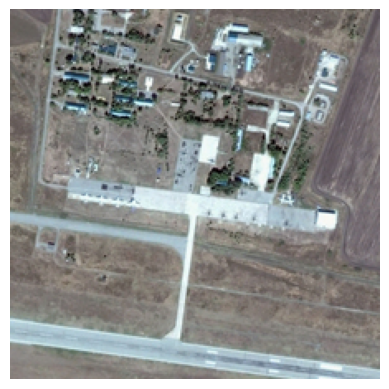

['several planes are in an airport near some buildings and green trees.'
 'several planes are located in an airport near some buildings and green trees.'
 'Several planes are located in an airport near some green buildings and trees.'
 'several planes are in an airport near some buildings and green trees.'
 'several planes are in an airport near some buildings and green trees .']


In [ ]:
idx = 50

# pick row
row = df_train.iloc[idx]

img_dict = ast.literal_eval(row["image"])   # convert string → dict
img_bytes = img_dict["bytes"]

from PIL import Image
import io
import matplotlib.pyplot as plt

img = Image.open(io.BytesIO(img_bytes))
plt.imshow(img)
plt.axis("off")
plt.show()
print(df_train['captions'][idx])

In [ ]:
spacy_eng = spacy.load("en_core_web_sm")
text = 'some planes are near a large building in an airport.'
doc = spacy_eng.tokenizer(text)
print([token.text for token in doc])

['some', 'planes', 'are', 'near', 'a', 'large', 'building', 'in', 'an', 'airport', '.']


## Text Preprocessing and Vocabulary Construction

Captions are cleaned, tokenized, and converted into word indices. A vocabulary is built with frequency thresholding and special tokens.

In [ ]:
# --- VOCABULARY CLASS ---
class Vocabulary:
  def __init__(self, freq_threshold=1):
    self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}
    self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}
    self.freq_threshold = freq_threshold

  def __len__(self):
    return len(self.itos)

  def tokenizer_eng(self, text):
    return [token.text.lower() for token in spacy_eng.tokenizer(text)]

  def build_vocabulary(self, sentence_list):
    frequencies = Counter()
    idx = 4
    for sentence in sentence_list:
      for word in self.tokenizer_eng(sentence):
        frequencies[word] += 1

        if frequencies[word] == self.freq_threshold:
          self.stoi[word] = idx
          self.itos[idx] = word
          idx += 1

  def numericalize(self, text):
    tokenized_text = self.tokenizer_eng(text)
    return [
        self.stoi[token] if token in self.stoi else self.stoi["<UNK>"]
        for token in tokenized_text
    ]

In [ ]:
#Testing the Vocab Class
v = Vocabulary(freq_threshold=1)

v.build_vocabulary(["Some planes are close to a large building at an airport."])
print(v.stoi)
print(v.numericalize("some planes are near a large building in an airport ."))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'some': 4, 'planes': 5, 'are': 6, 'close': 7, 'to': 8, 'a': 9, 'large': 10, 'building': 11, 'at': 12, 'an': 13, 'airport': 14, '.': 15}
[4, 5, 6, 3, 9, 10, 11, 3, 13, 14, 15]


In [ ]:
def load_glove_embeddings(vocab, embed_size):
    glove_path = "/content/glove.6B.300d.txt"
    if not os.path.exists(glove_path):
        print("GloVe file not found. Skipping pre-trained embeddings.")
        return None

    embeddings_index = {}
    with open(glove_path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs

    # Initialize random embeddings
    embedding_matrix = np.random.uniform(-0.1, 0.1, (len(vocab), 300))

    hits = 0
    for i, word in vocab.itos.items():
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector
            hits += 1

    print(f"Loaded {hits} words from GloVe.")
    return torch.tensor(embedding_matrix).float()

In [ ]:
# --- TEXT PREPROCESSING FUNCTIONS ---
def clean_caption(caption_str):
    raw_captions = re.findall(r"'([^']*?)(?:\.)?'\s*\n?", caption_str)
    cleaned_captions = []
    for cap in raw_captions:
        cap = cap.lower()
        cap = re.sub(r"[^a-z\s]+", "", cap)
        cap = re.sub(r"\s+", " ", cap).strip()
        cleaned_captions.append(cap)
    return cleaned_captions

def process_caption(text, vocab):
  tokens = vocab.numericalize(text)
  return [vocab.stoi["<SOS>"]] + tokens + [vocab.stoi["<EOS>"]]

def pad_sequences(sequences, pad_value=0):
  max_len = max(len(seq) for seq in sequences)
  return [seq + [pad_value]*(max_len - len(seq)) for seq in sequences]

def pad_caption_group(seq_list, vocab):
    return pad_sequences(seq_list, pad_value=vocab.stoi["<PAD>"])

In [ ]:
# --- PREPARE DATAFRAMES ---
for df in [df_train, df_valid, df_test]:
    df['cleaned_captions'] = df['captions'].apply(lambda s : clean_caption(s))

# Build Vocab
vocab = Vocabulary(freq_threshold=5)
all_sentences = [s for sent_list in df_train['cleaned_captions'] for s in sent_list]
vocab.build_vocabulary(all_sentences)

# Tokenize
for df in [df_train, df_valid, df_test]:
    df['processed_captions'] = df['cleaned_captions'].apply(lambda sent_list: [process_caption(s, vocab) for s in sent_list])
    df['tokens'] = df['processed_captions'].apply(lambda seq_list: pad_caption_group(seq_list, vocab))

In [ ]:
df_train['tokens']

,tokens
0,"[[1, 4, 30, 5, 6, 7, 8, 9, 10, 11, 15, 12, 13,..."
1,"[[1, 20, 14, 5, 6, 15, 12, 13, 2, 0, 0], [1, 1..."
2,"[[1, 4, 30, 5, 6, 15, 12, 13, 17, 4, 28, 2, 0,..."
3,"[[1, 4, 30, 5, 6, 17, 9, 19, 11, 32, 12, 13, 2..."
4,"[[1, 27, 29, 22, 24, 25, 5, 37, 9, 26, 21, 49,..."
...,...
8729,"[[1, 16, 339, 388, 211, 163, 233, 3, 3, 21, 3,..."
8730,"[[1, 16, 211, 163, 31, 17, 16, 402, 50, 54, 35..."
8731,"[[1, 32, 16, 154, 21, 16, 76, 38, 5, 59, 3, 89..."
8732,"[[1, 103, 31, 9, 341, 211, 163, 104, 23, 206, ..."


## Dataset and DataLoader

Custom PyTorch Dataset and DataLoader for image–caption pairs with multiple references.

In [ ]:
# --- DATASET & DATALOADER ---
class CustomDatasetWithRefs(Dataset):
  def __init__(self, df, transform=None):
    self.df = df.reset_index(drop=True)
    self.transform = transform

  def __len__(self):
    return len(self.df)

  def __getitem__(self, idx):
    row = self.df.iloc[idx]
    img_dict = ast.literal_eval(row["image"])
    img_bytes = img_dict["bytes"]
    img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
    if self.transform:
      img = self.transform(img)
    chosen_caps = random.choice(row["tokens"])
    refs = row["tokens"]
    return img, chosen_caps, refs

def collate_fn_batch_with_refs(batch):
  images, chosen_caps, refs = zip(*batch)
  images = torch.stack(images, dim=0)
  cap_tensors = [torch.tensor(c, dtype=torch.long) for c in chosen_caps]
  max_len = max([c.size(0) for c in cap_tensors])
  padded = [F.pad(c, (0, max_len - c.size(0)), value=vocab.stoi["<PAD>"]) if c.size(0) < max_len else c for c in cap_tensors]
  captions = torch.stack(padded, dim=0)
  return images, captions, refs

## Model Architecture

The model consists of a ResNet50 CNN encoder and a Transformer decoder with multi-head attention.

In [ ]:
class CNN_Encoder(nn.Module):
    def __init__(self, embed_size, dropout_probs=0.3, fine_tune_layers=5):
        super(CNN_Encoder, self).__init__()
        resnet = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V1)
        modules = list(resnet.children())[:-2]
        self.model = nn.Sequential(*modules)
        self.embed_size = embed_size

        for param in self.model.parameters():
            param.requires_grad = False

        if fine_tune_layers > 0:
            layers_list = list(self.model.children())
            for layer in layers_list[-fine_tune_layers:]:
                for param in layer.parameters():
                    param.requires_grad = True

        self.projection = nn.Linear(2048, embed_size)
        self.bn = nn.BatchNorm1d(embed_size)
        self.dropout = nn.Dropout(p=dropout_probs)
        self.visual_pos_embed = nn.Parameter(torch.randn(1, 49, embed_size))

    def forward(self, image):
        features = self.model(image) # [B, 2048, 7, 7]
        B, C, H, W = features.size()
        features = features.view(B, C, H * W).permute(0, 2, 1)
        features = self.projection(features)
        features_flat = features.reshape(B * H * W, self.embed_size)
        features_flat = self.bn(features_flat)
        features = features_flat.reshape(B, H * W, self.embed_size)
        features = features + self.visual_pos_embed
        return self.dropout(features)

In [ ]:
class ScaledDotProductAttention(nn.Module):
    def __init__(self, dropout=0.1):
        super().__init__()
        self.dropout = nn.Dropout(dropout)

    def forward(self, q, k, v, mask=None):
        d_k = q.size(-1)
        scores = torch.matmul(q, k.transpose(-2, -1)) / math.sqrt(d_k)
        if mask is not None:
            scores = scores.masked_fill(mask == 0, float('-inf'))
        attn_weights = F.softmax(scores, dim=-1)
        attn_weights = self.dropout(attn_weights)
        output = torch.matmul(attn_weights, v)
        return output, attn_weights

class MultiHeadAttention(nn.Module):
    def __init__(self, embed_size, num_heads, dropout=0.1):
        super().__init__()
        assert embed_size % num_heads == 0, "Embed size must be divisible by num_heads"
        self.embed_size = embed_size
        self.num_heads = num_heads
        self.head_dim = embed_size // num_heads

        self.q_linear = nn.Linear(embed_size, embed_size)
        self.k_linear = nn.Linear(embed_size, embed_size)
        self.v_linear = nn.Linear(embed_size, embed_size)
        self.out_linear = nn.Linear(embed_size, embed_size)
        self.attention = ScaledDotProductAttention(dropout)

    def forward(self, q, k, v, mask=None):
        B = q.size(0)
        q = self.q_linear(q).view(B, -1, self.num_heads, self.head_dim).transpose(1, 2)
        k = self.k_linear(k).view(B, -1, self.num_heads, self.head_dim).transpose(1, 2)
        v = self.v_linear(v).view(B, -1, self.num_heads, self.head_dim).transpose(1, 2)
        out, attn_weights = self.attention(q, k, v, mask=mask)
        out = out.transpose(1, 2).contiguous().view(B, -1, self.embed_size)
        return self.out_linear(out), attn_weights

class PositionwiseFeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout=0.1):
        super().__init__()
        self.fc1 = nn.Linear(d_model, d_ff)
        self.fc2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)
        self.activation = nn.GELU()

    def forward(self, x):
        return self.fc2(self.dropout(self.activation(self.fc1(x))))

class TransformerDecoderLayer(nn.Module):
    def __init__(self, embed_size, num_heads, ff_hidden, dropout=0.1):
        super().__init__()
        self.self_attn = MultiHeadAttention(embed_size, num_heads, dropout)
        self.norm1 = nn.LayerNorm(embed_size)
        self.dropout1 = nn.Dropout(dropout)
        self.cross_attn = MultiHeadAttention(embed_size, num_heads, dropout)
        self.norm2 = nn.LayerNorm(embed_size)
        self.dropout2 = nn.Dropout(dropout)
        self.ffn = PositionwiseFeedForward(embed_size, ff_hidden, dropout)
        self.norm3 = nn.LayerNorm(embed_size)
        self.dropout3 = nn.Dropout(dropout)

    def forward(self, x, image_features, tgt_mask=None, memory_mask=None, return_attn=False):
        _x = self.norm1(x)
        attn_out, self_attn_weights = self.self_attn(_x, _x, _x, mask=tgt_mask)
        x = x + self.dropout1(attn_out)

        _x = self.norm2(x)
        attn_out, cross_attn_weights = self.cross_attn(_x, image_features, image_features, mask=memory_mask)
        x = x + self.dropout2(attn_out)

        _x = self.norm3(x)
        ffn_out = self.ffn(_x)
        x = x + self.dropout3(ffn_out)

        if return_attn:
            return x, self_attn_weights, cross_attn_weights
        return x

class TransformerDecoder(nn.Module):
    def __init__(self, embed_size, num_heads, num_layers, ff_hidden=2048, dropout=0.1):
        super().__init__()
        self.layers = nn.ModuleList([
            TransformerDecoderLayer(embed_size, num_heads, ff_hidden, dropout)
            for _ in range(num_layers)
        ])
        self.norm = nn.LayerNorm(embed_size)

    def forward(self, x, image_features, tgt_mask=None, memory_mask=None, return_attn=False):
        self_attn_list = []
        cross_attn_list = []
        for layer in self.layers:
            if return_attn:
                x, self_attn, cross_attn = layer(x, image_features, tgt_mask, memory_mask, return_attn=True)
                self_attn_list.append(self_attn)
                cross_attn_list.append(cross_attn)
            else:
                x = layer(x, image_features, tgt_mask, memory_mask, return_attn=False)
        x = self.norm(x)
        if return_attn:
            return x, self_attn_list, cross_attn_list
        return x

In [ ]:
class PositionalEncoding(nn.Module):
    def __init__(self, max_len, d_model, dropout=0.1):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('positional_encoding', pe)

    def forward(self, x):
        x = x + self.positional_encoding[:, :x.size(1), :].to(x.device)
        return self.dropout(x)

In [ ]:
class ImageCaptionModel(nn.Module):
    def __init__(self, transformer_decoder, vocab_size, embedding_size, pad_idx, max_pos_len=5000, pretrained_emb=None):
        super().__init__()
        self.TransformerDecoder = transformer_decoder
        self.embedding_size = embedding_size
        self.pad_idx = pad_idx

        self.lm_head = nn.Linear(embedding_size, vocab_size)
        self.pos_encoder = PositionalEncoding(d_model=embedding_size, dropout=0.1, max_len=max_pos_len)

        self.use_glove = False
        if pretrained_emb is not None:
            self.use_glove = True
            self.embedding = nn.Embedding.from_pretrained(pretrained_emb, freeze=False)
            self.glove_projection = nn.Linear(300, embedding_size)
        else:
            self.embedding = nn.Embedding(vocab_size, embedding_size, padding_idx=pad_idx)

        self._init_weights()

    def _init_weights(self):
        for p in self.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)
        nn.init.zeros_(self.lm_head.bias)

    def build_masks(self, decoder_inp):
        seq_len = decoder_inp.size(1)
        causal_mask = torch.tril(torch.ones((seq_len, seq_len), device=decoder_inp.device, dtype=torch.bool)).unsqueeze(0).unsqueeze(0)
        padding_mask = (decoder_inp != self.pad_idx).unsqueeze(1).unsqueeze(2)
        return causal_mask & padding_mask

    def forward(self, encoded_image, decoder_inp, return_attn=False):
        tgt_emb = self.embedding(decoder_inp)
        if self.use_glove:
            tgt_emb = self.glove_projection(tgt_emb)
        tgt_emb = tgt_emb * math.sqrt(self.embedding_size)
        tgt_emb = self.pos_encoder(tgt_emb)
        tgt_mask = self.build_masks(decoder_inp)

        if return_attn:
            dec_out, self_attn, cross_attn = self.TransformerDecoder(tgt_emb, encoded_image, tgt_mask, return_attn=True)
            logits = self.lm_head(dec_out)
            return logits, None, self_attn, cross_attn
        else:
            dec_out = self.TransformerDecoder(tgt_emb, encoded_image, tgt_mask, return_attn=False)
            logits = self.lm_head(dec_out)
            return logits, None

In [ ]:
# --- GLOVE LOADING ---
def load_glove_embeddings(vocab, glove_path="/content/glove/glove.6B.300d.txt"):
    if not os.path.exists(glove_path):
        print("GloVe file not found. Training from scratch.")
        return None
    print("Loading GloVe embeddings...")
    embeddings_index = {}
    with open(glove_path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
    embedding_matrix = np.random.uniform(-0.1, 0.1, (len(vocab), 300))
    hits = 0
    for i, word in vocab.itos.items():
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector
            hits += 1
    print(f"Loaded {hits} words from GloVe.")
    return torch.tensor(embedding_matrix).float()

## Training Configuration

Hyperparameters, optimizer, loss function, learning rate scheduler, and regularization techniques.

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 32 if DEVICE.type == "cuda" else 16
NUM_EPOCHS = 10
GRAD_CLIP = 1.0
NUM_WORKERS = 4 if DEVICE.type == "cuda" else 0
MAX_TARGET_LEN = 30

D_MODEL = 512
NUM_HEADS = 8
NUM_LAYERS = 4
FF_HIDDEN = 2048
LR = 1e-4
WEIGHT_DECAY = 1e-4

print("Device:", DEVICE, "Batch size:", BATCH_SIZE, "D_MODEL:", D_MODEL)

Device: cuda Batch size: 32 D_MODEL: 512


In [ ]:
transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

train_dataset = CustomDatasetWithRefs(df_train, transform=transform)
valid_dataset = CustomDatasetWithRefs(df_valid, transform=transform)
test_dataset  = CustomDatasetWithRefs(df_test, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, collate_fn=collate_fn_batch_with_refs)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, collate_fn=collate_fn_batch_with_refs)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, collate_fn=collate_fn_batch_with_refs)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
# --- INITIALIZE MODEL ---
glove_emb = load_glove_embeddings(vocab)

encoder = CNN_Encoder(embed_size=D_MODEL, dropout_probs=0.1).to(DEVICE)
transformer_decoder = TransformerDecoder(embed_size=D_MODEL, num_heads=NUM_HEADS, num_layers=NUM_LAYERS).to(DEVICE)
model = ImageCaptionModel(transformer_decoder=transformer_decoder,
                          vocab_size=len(vocab),
                          embedding_size=D_MODEL,
                          pad_idx=vocab.stoi["<PAD>"],
                          max_pos_len=5000,
                          pretrained_emb=glove_emb).to(DEVICE)

optimizer = torch.optim.AdamW(list(model.parameters()) + list(encoder.parameters()), lr=LR, weight_decay=WEIGHT_DECAY)
criterion = nn.CrossEntropyLoss(ignore_index=vocab.stoi["<PAD>"], label_smoothing=0.1)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

Loading GloVe embeddings...
Loaded 1010 words from GloVe.
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 133MB/s]


In [ ]:
# --- DECODING FUNCTIONS ---
def decode_token_ids(token_ids, vocab):
  words = []
  for t in token_ids:
      if t == vocab.stoi["<EOS>"]: break
      if t in (vocab.stoi["<SOS>"], vocab.stoi["<PAD>"]): continue
      words.append(vocab.itos.get(t, "<UNK>"))
  return words

In [ ]:
@torch.no_grad()
def greedy_decode_batch(encoder, model, images, sos_idx, eos_idx, max_len=MAX_TARGET_LEN):
  encoder.eval(); model.eval()
  B = images.size(0)
  images = images.to(DEVICE)
  img_feats = encoder(images)
  outputs = torch.full((B, 1), sos_idx, dtype=torch.long, device=DEVICE)
  finished = torch.zeros(B, dtype=torch.bool, device=DEVICE)

  for _ in range(max_len-1):
      logits, _ = model(img_feats, outputs, return_attn=False)
      next_logits = logits[:, -1, :]
      next_tokens = next_logits.argmax(dim=-1, keepdim=True)
      outputs = torch.cat([outputs, next_tokens], dim=1)
      finished = finished | (next_tokens.squeeze(1) == eos_idx)
      if finished.all(): break
  return outputs.cpu().tolist()

## Model Training

The model is trained using teacher forcing, label smoothing, gradient clipping, and learning rate scheduling.

In [ ]:
# --- TRAINING LOOP ---
best_bleu4 = 0.0

for epoch in range(1, NUM_EPOCHS + 1):
    model.train(); encoder.train()
    running_loss = 0.0
    t0 = time.time()

    for i, (images, captions, refs) in enumerate(train_loader, 1):
        images, captions = images.to(DEVICE), captions.to(DEVICE)
        inputs, targets = captions[:, :-1], captions[:, 1:]
        optimizer.zero_grad()
        img_feats = encoder(images)
        logits, _ = model(img_feats, inputs)
        B, Tm1, V = logits.shape
        loss = criterion(logits.view(-1, V), targets.contiguous().view(-1))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(list(model.parameters()) + list(encoder.parameters()), GRAD_CLIP)
        optimizer.step()
        running_loss += loss.item()

    # Validation
    model.eval(); encoder.eval()
    val_losses = []
    all_refs, all_hyps = [], []

    with torch.no_grad():
        for images, captions, refs in valid_loader:
            images, captions = images.to(DEVICE), captions.to(DEVICE)
            inputs, targets = captions[:, :-1], captions[:, 1:]
            img_feats = encoder(images)
            logits, _ = model(img_feats, inputs)
            B, Tm1, V = logits.shape
            val_losses.append(criterion(logits.view(-1, V), targets.contiguous().view(-1)).item())

            preds = greedy_decode_batch(encoder, model, images, vocab.stoi["<SOS>"], vocab.stoi["<EOS>"])
            for b, p in enumerate(preds):
                all_hyps.append(decode_token_ids(p[1:], vocab))
                all_refs.append([decode_token_ids(r, vocab) for r in refs[b]])

    mean_val_loss = float(np.mean(val_losses))
    scheduler.step(mean_val_loss)
    bleu4 = corpus_bleu(all_refs, all_hyps, weights=(0.25, 0.25, 0.25, 0.25))

    print(f"Epoch {epoch} | Loss: {mean_val_loss:.4f} | BLEU-4: {bleu4:.4f}")

    if bleu4 > best_bleu4:
        best_bleu4 = bleu4
        checkpoint = {
            "model": model.state_dict(),
            "encoder": encoder.state_dict(),
            "optimizer": optimizer.state_dict(),
            "vocab": vocab,
            "bleu4": bleu4,
            "epoch": epoch
        }
        torch.save(checkpoint, "best_caption_model.pt")
        print(f"Saved Best Model (BLEU-4: {best_bleu4:.4f})")

Epoch 1 | Loss: 2.9322 | BLEU-4: 0.3558
Saved Best Model (BLEU-4: 0.3558)
Epoch 2 | Loss: 2.7798 | BLEU-4: 0.3906
Saved Best Model (BLEU-4: 0.3906)
Epoch 3 | Loss: 2.7767 | BLEU-4: 0.3680
Epoch 4 | Loss: 2.7479 | BLEU-4: 0.3613
Epoch 5 | Loss: 2.6836 | BLEU-4: 0.4014
Saved Best Model (BLEU-4: 0.4014)
Epoch 6 | Loss: 2.7031 | BLEU-4: 0.4258
Saved Best Model (BLEU-4: 0.4258)
Epoch 7 | Loss: 2.7467 | BLEU-4: 0.4110
Epoch 8 | Loss: 2.6847 | BLEU-4: 0.3883
Epoch 9 | Loss: 2.7729 | BLEU-4: 0.4102
Epoch 10 | Loss: 2.7330 | BLEU-4: 0.3984


In [ ]:
from google.colab import files
files.download("best_caption_model.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Beam Search Decoding and Evaluation

Captions are generated using beam search and evaluated using BLEU-4.

In [ ]:
def beam_search_decode(encoder, model, image, vocab, beam_size=5, max_len=30, alpha=0.7):
    encoder.eval(); model.eval()
    device = image.device

    # 1. Encode
    with torch.no_grad():
        img_feats = encoder(image.unsqueeze(0))

    # 2. Start with SOS
    k_candidates = [(0.0, 0.0, torch.tensor([vocab.stoi["<SOS>"]], device=device))]

    for step in range(max_len):
        new_candidates = []
        for norm_score, cum_score, seq in k_candidates:
            if seq[-1].item() == vocab.stoi["<EOS>"]:
                length = len(seq) - 1
                updated_norm = cum_score / (length ** alpha)
                new_candidates.append((updated_norm, cum_score, seq))
                continue

            # Predict next token
            with torch.no_grad():
                inputs = seq.unsqueeze(0)
                logits, _ = model(img_feats, inputs)
                log_probs = F.log_softmax(logits[:, -1, :], dim=-1)

            # Get top k
            topk_probs, topk_ids = log_probs.topk(beam_size)

            for i in range(beam_size):
                prob = topk_probs[0][i].item()
                token_id = topk_ids[0][i].unsqueeze(0)

                new_cum_score = cum_score + prob
                new_seq = torch.cat([seq, token_id])

                # score = log_prob / (length ^ alpha)
                length = new_seq.size(0) - 1
                # Avoid division by zero
                if length == 0: length = 1

                new_norm_score = new_cum_score / (length ** alpha)

                new_candidates.append((new_norm_score, new_cum_score, new_seq))

        # Sort by NORMALIZED score, keep top k
        k_candidates = sorted(new_candidates, key=lambda x: x[0], reverse=True)[:beam_size]

        # If all top candidates are finished, stop
        if all(c[2][-1].item() == vocab.stoi["<EOS>"] for c in k_candidates):
            break

    return k_candidates[0][2].tolist()

In [ ]:
# 1. Load the Best Weights
print("Loading Best Model...")
checkpoint = torch.load("best_caption_model.pt", map_location=DEVICE, weights_only=False)
model.load_state_dict(checkpoint['model'])
encoder.load_state_dict(checkpoint['encoder'])

# 2. Set Evaluation Mode
model.eval()
encoder.eval()

# 3. Define the Grid Search Space
# We try standard Alpha (0.6, 0.8) and lower Beam Sizes (3, 5) which often generalize better
beam_candidates = [3, 5]
alpha_candidates = [0.6, 0.8, 1.0]

results_log = []

print(f"{'Beam':<6} | {'Alpha':<6} | {'BLEU-4':<8} | {'Avg Len':<8}")
print()

for beam in beam_candidates:
    for alpha in alpha_candidates:
        test_refs, test_hyps = [], []

        with torch.no_grad():
            for images, captions, refs in test_loader:
                images = images.to(DEVICE)
                for i in range(images.size(0)):
                    pred = beam_search_decode(
                        encoder,
                        model,
                        images[i],
                        vocab,
                        beam_size=beam,
                        alpha=alpha
                    )
                    test_hyps.append(decode_token_ids(pred[1:], vocab))
                    test_refs.append([decode_token_ids(r, vocab) for r in refs[i]])

        # Calculate Score for this combo
        score = corpus_bleu(test_refs, test_hyps, weights=(0.25, 0.25, 0.25, 0.25))
        avg_len = sum(len(h) for h in test_hyps) / len(test_hyps)

        print(f"{beam:<6} | {alpha:<6} | {score:.4f}   | {avg_len:.2f}")
        results_log.append((beam, alpha, score))

# 4. Select Winner
best_result = max(results_log, key=lambda x: x[2])
print()
print(f"BEST CONFIGURATION: Beam={best_result[0]}, Alpha={best_result[1]}")
print(f"BEST BLEU-4: {best_result[2]:.4f}")

Loading Best Model...
Beam   | Alpha  | BLEU-4   | Avg Len 

3      | 0.6    | 0.2742   | 9.85
3      | 0.8    | 0.2710   | 10.07
3      | 1.0    | 0.2681   | 10.32
5      | 0.6    | 0.2735   | 9.83
5      | 0.8    | 0.2704   | 10.09
5      | 1.0    | 0.2673   | 10.36

BEST CONFIGURATION: Beam=3, Alpha=0.6
BEST BLEU-4: 0.2742


## Attention Map Visualization

Visualizes cross-attention between generated words and spatial image regions.

In [ ]:
# --- VISUALIZATION HELPERS ---
def greedy_decode_with_attention(encoder, model, image_batch, sos_idx, eos_idx, max_len=30):
    encoder.eval(); model.eval()
    B = image_batch.size(0)
    device = image_batch.device
    with torch.no_grad(): memory = encoder(image_batch)
    ys = torch.full((B, 1), sos_idx, dtype=torch.long, device=device)
    num_layers = len(model.TransformerDecoder.layers)
    attn_store = [[] for _ in range(num_layers)]
    finished = torch.zeros(B, dtype=torch.bool, device=device)

    for _ in range(max_len):
        with torch.no_grad(): logits, _, _, cross_attns = model(memory, ys, return_attn=True)
        for L in range(num_layers): attn_store[L].append(cross_attns[L][:, :, -1:, :])
        next_token = logits[:, -1, :].argmax(dim=-1)
        ys = torch.cat([ys, next_token.unsqueeze(1)], dim=1)
        finished |= (next_token == eos_idx)
        if finished.all(): break

    tokens_batch = [ys[b].tolist()[:ys[b].tolist().index(eos_idx)+1] if eos_idx in ys[b].tolist() else ys[b].tolist() for b in range(B)]
    all_layer_attns = [torch.cat(attn_store[L], dim=2) for L in range(num_layers)]
    return tokens_batch, all_layer_attns

def visualize_attention_on_image(image, tokens, attn_layers, vocab):
    img_np = image.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    caption_tokens = [vocab.itos[t] for t in tokens if t not in [vocab.stoi["<PAD>"], vocab.stoi["<SOS>"], vocab.stoi["<EOS>"]]]
    print(f"Generated: {' '.join(caption_tokens)}")

    num_tokens = len(caption_tokens)
    if num_tokens == 0: return

    fig, axes = plt.subplots(1, num_tokens, figsize=(3 * num_tokens, 3))
    if num_tokens == 1: axes = [axes]

    attn_avg = attn_layers[-1][0].mean(dim=0) # Last layer, avg heads
    spatial_size = int(np.sqrt(attn_avg.size(1)))

    from scipy.ndimage import zoom
    for t in range(num_tokens):
        attn_map = attn_avg[t].cpu().numpy().reshape(spatial_size, spatial_size)
        attn_resized = zoom(attn_map, (img_np.shape[0] / spatial_size, img_np.shape[1] / spatial_size), order=1)
        axes[t].imshow(img_np)
        axes[t].imshow(attn_resized, cmap='jet', alpha=0.6)
        axes[t].set_title(caption_tokens[t])
        axes[t].axis('off')
    plt.show()


Example index: 573

Reference captions:
 - <SOS> the trees around the parking lot cast shadows on <UNK> <EOS>
 - <SOS> the trees around the parking lot cast shadows <UNK> it <EOS>
 - <SOS> three <UNK> of <UNK> and white cars stop in the parking <EOS>
 - <SOS> trees are casting large shadows on this parking lot <EOS>
 - <SOS> many cars are parked in a parking lot near several green trees <EOS>
Generated: many cars are parked in a parking lot with some green trees


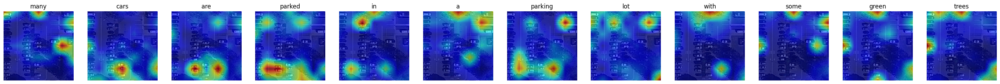


Example index: 770

Reference captions:
 - <SOS> the parking lot is close to the pool next to a building in the shape of <UNK> <UNK> a red roof on the beach <EOS>
 - <SOS> the parking lot is close to the swimming pool next to a red roof <UNK> shaped building on the beach <EOS>
 - <SOS> the parking lot is close to the swimming pool next to a <UNK> shaped building <UNK> a red roof on the beach <EOS>
 - <SOS> several red houses next to a swimming pool as well as rows of <UNK> trees can be found in this resort <EOS>
 - <SOS> some red buildings and green trees are in a resort near a beach <EOS>
Generated: many green trees and several buildings are in a resort


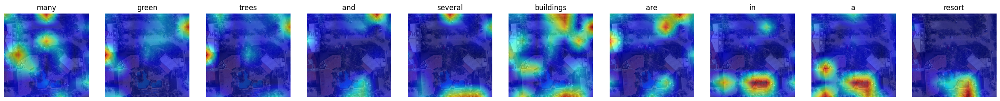


Example index: 132

Reference captions:
 - <SOS> there are some <UNK> rocks near the beach <EOS>
 - <SOS> the vast sea is <UNK> <UNK> rock <EOS>
 - <SOS> the vast sea is <UNK> <UNK> rock <EOS>
 - <SOS> there are some <UNK> rocks near the beach <EOS>
 - <SOS> there are some <UNK> rocks near the beach <EOS>
Generated: white waves are between yellow beach and green ocean


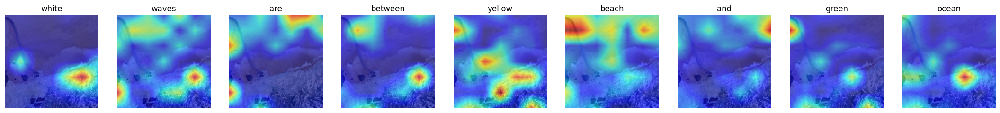


Example index: 861

Reference captions:
 - <SOS> a white car and a red car stop at <UNK> next to a twisted stretch of road <EOS>
 - <SOS> a white car and a red car stop in the house next to a crooked stretch of road <EOS>
 - <SOS> a white car and a red car stop at the house next to a stretch of twisty road <EOS>
 - <SOS> it is a smart house with a yellow roof located in this bareland surrounded by trees <EOS>
 - <SOS> a red building surrounded by green trees is near a road <EOS>
Generated: many green trees are around a building


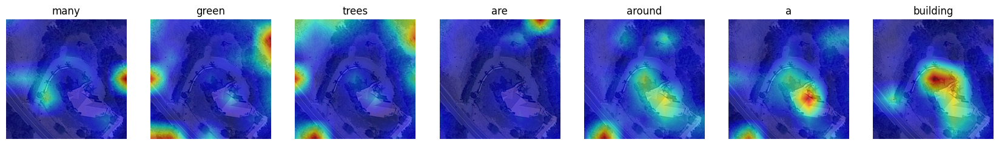


Example index: 925

Reference captions:
 - <SOS> a square stage with parked car lines are located near a road <EOS>
 - <SOS> a square stadium with parked car lines are located near a road <EOS>
 - <SOS> a square stadium with lines of parked cars are located near a road <EOS>
 - <SOS> this is a rectangular soccer stadium with rows of bleachers next to a parking lot <EOS>
 - <SOS> many cars are near a white stadium with a football field in it <EOS>
Generated: some buildings are close to a stadium


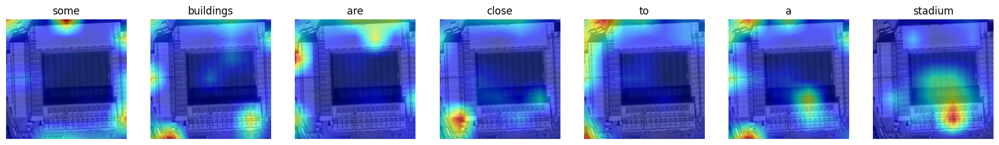


Example index: 939

Reference captions:
 - <SOS> beside a road there is a football field with parking lots without a car <EOS>
 - <SOS> next to a road there is a football pitch with some empty parking lots <EOS>
 - <SOS> beside a road there is a football field with some empty parking lots <EOS>
 - <SOS> it is a smart soccer stadium with light grey roofs surrounded by a parking lot and a straight street <EOS>
 - <SOS> a parking lot is near a stadium with a football field in it <EOS>
Generated: several buildings are close to a stadium


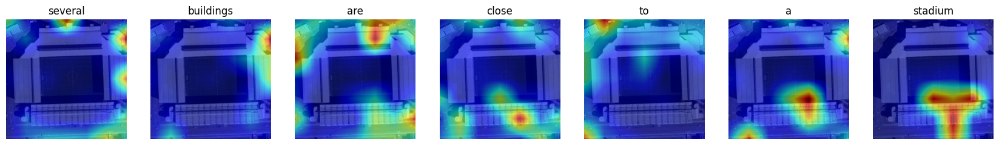


Example index: 952

Reference captions:
 - <SOS> s a factory next to the river <EOS>
 - <SOS> <EOS>
 - <SOS> there <EOS>
 - <SOS> there is a factory beside the river <EOS>
Generated: many storage tanks are surrounded by green meadows and a parking lot


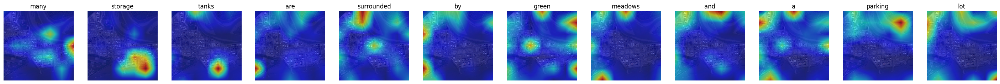


Example index: 472

Reference captions:
 - <SOS> on both sides of the road are houses lined with grey roofs <EOS>
 - <SOS> many trees were planted around the houses <EOS>
 - <SOS> many trees were planted around the houses <EOS>
 - <SOS> on both sides of the road are houses lined with grey ceilings <EOS>
 - <SOS> on both sides of the road are houses lined with grey roofs <EOS>
Generated: some buildings and many green trees are in an average residential area


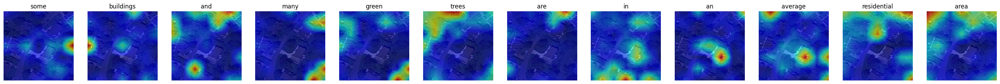


Example index: 545

Reference captions:
 - <SOS> the water park has <UNK> a <UNK> swimming pool and other <UNK> pools <EOS>
 - <SOS> here is an <UNK> park on the bank near a road <EOS>
 - <SOS> the park in the forest contains <UNK> facilities and <UNK> <UNK> <EOS>
 - <SOS> the park with several buildings which has blue roofs sits at the bank of the river <EOS>
 - <SOS> many green trees are around a park with some play facilities <EOS>
Generated: many green trees and some buildings are in a resort with a pond


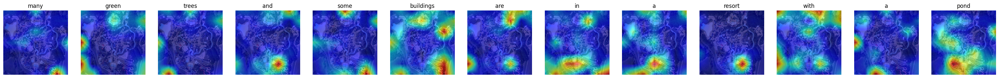


Example index: 144

Reference captions:
 - <SOS> on both sides of the river there are many grey houses covered <EOS>
 - <SOS> s a beautiful bridge over the river <EOS>
 - <SOS> <EOS>
 - <SOS> <EOS>
Generated: a bridge is over a river with some green trees and several buildings on two sides of it


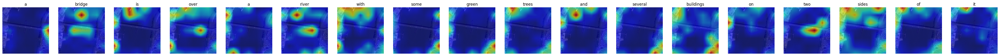

In [ ]:
# Load the weights
checkpoint = torch.load("best_caption_model.pt", map_location=DEVICE, weights_only=False)
model.load_state_dict(checkpoint['model'])
encoder.load_state_dict(checkpoint['encoder'])

# Set Evaluation Mode
model.eval()
encoder.eval()

# Running visualization on 10 random test samples
NUM_EXAMPLES = 10
indices = random.sample(range(len(test_dataset)), NUM_EXAMPLES)

for idx in indices:
    img, cap, refs = test_dataset[idx]
    img_batch = img.unsqueeze(0).to(DEVICE)

    # Decode with attention
    tokens_batch, attns = greedy_decode_with_attention(
        encoder,
        model,
        img_batch,
        sos_idx=vocab.stoi["<SOS>"],
        eos_idx=vocab.stoi["<EOS>"],
        max_len=MAX_TARGET_LEN
    )

    tokens = tokens_batch[0]
    attn_layers = attns

    print("\n" + "="*90)
    print(f"Example index: {idx}")

    # Print references
    print("\nReference captions:")
    for r in refs:
        print(" - " + " ".join(vocab.itos[t] for t in r if t not in [vocab.stoi["<PAD>"]]))

    # Visualize attention across all tokens (like your reference image)
    visualize_attention_on_image(
        image=img.cpu(),
        tokens=tokens,
        attn_layers=attn_layers,
        vocab=vocab
    )

## Conclusion

This notebook demonstrated a complete CNN–Transformer pipeline for remote sensing image captioning on the RSICD dataset, achieving competitive BLEU-4 performance and producing interpretable attention visualizations for complex aerial scenes.